2. Przetwarzanie wstępne

In [1]:
import pyspark
from pyspark.sql import SparkSession
from pyspark.sql.functions import *
spark = SparkSession.builder.appName("KcHouseData").master("local[*]").getOrCreate()

Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
24/04/27 11:16:34 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


In [2]:
from pyspark import SparkFiles
 
url = "https://dysk.agh.edu.pl/s/nWNWeirnCJDQycp/download/kc_house_data.csv.gz"
spark.sparkContext.addFile(url)
 
df = spark.read.csv(SparkFiles.get("kc_house_data.csv.gz"), header=True, inferSchema=True)
df.show(5)

+----------+---------------+--------+--------+---------+-----------+--------+------+----------+----+---------+-----+----------+-------------+--------+------------+-------+-------+--------+-------------+----------+
|        id|           date|   price|bedrooms|bathrooms|sqft_living|sqft_lot|floors|waterfront|view|condition|grade|sqft_above|sqft_basement|yr_built|yr_renovated|zipcode|    lat|    long|sqft_living15|sqft_lot15|
+----------+---------------+--------+--------+---------+-----------+--------+------+----------+----+---------+-----+----------+-------------+--------+------------+-------+-------+--------+-------------+----------+
|7129300520|20141013T000000|221900.0|       3|      1.0|       1180|    5650|   1.0|         0|   0|        3|    7|      1180|            0|    1955|           0|  98178|47.5112|-122.257|         1340|      5650|
|6414100192|20141209T000000|538000.0|       3|     2.25|       2570|    7242|   2.0|         0|   0|        3|    7|      2170|          400|   

In [3]:
pdf = df.toPandas()
print(pdf.info())
pdf.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int32  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int32  
 6   sqft_lot       21613 non-null  int32  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int32  
 9   view           21613 non-null  int32  
 10  condition      21613 non-null  int32  
 11  grade          21613 non-null  int32  
 12  sqft_above     21613 non-null  int32  
 13  sqft_basement  21613 non-null  int32  
 14  yr_built       21613 non-null  int32  
 15  yr_renovated   21613 non-null  int32  
 16  zipcode        21613 non-null  int32  
 17  lat            21613 non-null  float64
 18  long  

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [4]:
df = df.withColumn("date", to_timestamp("date", "yyyyMMdd'T'HHmmss"))
df = df.withColumn("unixdate", unix_timestamp("date"))

In [5]:
df = df.drop("date")

In [6]:
df = df.drop("id")

3. Regresja

In [7]:
from pyspark.ml.regression import LinearRegression
from pyspark.ml.feature import VectorAssembler

In [8]:
# Get all column names except 'price'
input_columns = [col for col in df.columns if col != 'price']

va = VectorAssembler(
    inputCols= input_columns,
    outputCol="features" 
)\

df_1 = va.transform(df)

lr = LinearRegression()\
  .setMaxIter(100)\
  .setRegParam(3.0)\
  .setElasticNetParam(0.5)\
  .setFeaturesCol("features")\
  .setLabelCol("price")

model = lr.fit(df_1)

24/04/27 11:16:55 WARN InstanceBuilder: Failed to load implementation from:dev.ludovic.netlib.blas.JNIBLAS
24/04/27 11:16:55 WARN InstanceBuilder: Failed to load implementation from:dev.ludovic.netlib.blas.VectorBLAS


In [9]:
print(f'RMSE: {model.summary.rootMeanSquaredError}')
print(f'r2: {model.summary.r2}')
print(f'iterations: {model.summary.totalIterations}')

RMSE: 200735.27852107986
r2: 0.7010253344728111
iterations: 37


3.1 Train test split

In [10]:
from pyspark.ml.regression import LinearRegression
from pyspark.ml.feature import VectorAssembler
from pyspark.ml import Pipeline
from pyspark.ml.evaluation import RegressionEvaluator
import pandas as pd

In [11]:
def SizeSplitFunction(split1, split2):
    df_train,df_test = df_1.randomSplit([split1, split2],seed=1)
    va = VectorAssembler(
    inputCols= input_columns
    )\
    
    pipeline = Pipeline(stages=[va,lr])
    model = pipeline.fit(df_train)
     
    df_train_pred = model.transform(df_train)
    df_test_pred = model.transform(df_test)
    evaluator = RegressionEvaluator() \
                .setLabelCol("price") \
                .setPredictionCol("prediction") \
                .setMetricName("rmse"); 
    #print(f'RMSE: {evaluator.evaluate(df_train_pred)}')
    rmse = evaluator.evaluate(df_train_pred)
    evaluator.setMetricName("r2")
    r2 = evaluator.evaluate(df_train_pred)
    #print(f'R2: {evaluator.evaluate(df_train_pred)}')
    return rmse, r2



In [12]:
SizeSplitFunction(0.3, 0.7)

count = df_1.count()

indexRange = [1,2,3,10,20,30,100,200,300]

table_rmse = []
table_r2 = []

for x in indexRange:
    print(x)
    test_size = 1-x*len(df_1.columns)/count
    rmse, r2 = SizeSplitFunction(1 - test_size, test_size)
    table_rmse.append(rmse)
    table_r2.append(r2)

data = {
    "RMSE": table_rmse,
    "R2": table_r2
}


df_2 = pd.DataFrame(data)
df_2

1


2


3


10


20


30


100


200


300


,RMSE,R2
0,42828.085051,0.982708
1,95686.484306,0.864805
2,108670.080094,0.802096
3,154314.015374,0.709493
4,182932.849428,0.841272
5,200327.813403,0.796675
6,207134.109762,0.732323
7,206655.314953,0.716616
8,211548.518820,0.707145


3.2 Funkcje

In [13]:
def evaluate_metrics(df,metrics=['r2','rmse','mse','mae'],label_col='price',prediction_col='prediction'):
    """
    Funkcja oblicza metryki regresji na podstawie zbioru danych zawierającego prawdziwe wartosci etykiet 
    i wartości przewidywane
    :param df: Dataset<Row> wejściowy zbiór danych
    :param metrics: lista metryk do obliczenia
    :param label_col: nazwa kolumny z wartosciami ściowymi
    :param prediction_col: nazwa kolumny zawierającej przewidywane wartosci
    :return: słownik zawierajacy pary (nazwa_metryki,wartosc) 
    """

    results = {}
    evaluator = RegressionEvaluator() \
                .setLabelCol(label_col) \
                .setPredictionCol(prediction_col) \
    
    if 'r2' in metrics:
        evaluator.setMetricName("r2");
        results['r2'] = evaluator.evaluate(df)
    if 'rmse' in metrics:
        evaluator.setMetricName("rmse");
      
        results['rmse'] = evaluator.evaluate(df)
    if 'mse' in metrics:
        evaluator.setMetricName("mse");
        results['mse'] = evaluator.evaluate(df)
    if 'mae' in metrics:
        evaluator.setMetricName("mae");
        results['mae'] = evaluator.evaluate(df)
    
    return results

In [189]:
def train_and_test(_df,lr=LinearRegression()
                          .setMaxIter(100)
                          .setRegParam(3.0)
                          .setElasticNetParam(0.5)
                          .setFeaturesCol("features")
                          .setLabelCol("price")
                  ):
    """
    Funkcja (1) dzieli zbiór danych na ``df_train`` oraz ``df_test`` 
    (2) tworzy ciag przetwarzania zawierający ``VectorAssembler`` 
    i  przekazaną jako parametr konfiguracje algorytmu regresji
    (3) buduje model i dokonuje predykcji dla ``df_train`` oraz ``df_test``
    (4) wyświetla metryki
    :param df: wejściowy zbiór danych
    :param lr: konfiguracja algorytmu regresji
    :return: model  zwrócony przez ``pipeline.fit()``
    """
    df_train, df_test = _df.randomSplit([0.8, 0.2], seed=42)
    
    feature_cols = [col for col in _df.columns if col != "price"]
    assembler = VectorAssembler(inputCols=feature_cols, outputCol="features")
    
    pipeline = Pipeline(stages=[assembler, lr])
    
    model = pipeline.fit(df_train)
    
    train_predictions = model.transform(df_train)
    test_predictions = model.transform(df_test)
    
    train_metrics = evaluate_metrics(train_predictions)
    test_metrics = evaluate_metrics(test_predictions)
    
    print("Train Metrics:")
    print(train_metrics)
    print("Test Metrics:")
    print(test_metrics)
    
    return model

In [192]:
def print_coeffs(df, model, label):
    column_names = [col for col in df.columns if col != label]

    print(label + "=")
    
    i = 0;
    
    for coef in model.stages[1].coefficients:
        print("+ " + column_names[i] + " * " + str(coef))
        i+=1
    

In [86]:
df_3 = df
model = train_and_test(df_3)
print_coeffs(df_3, model, "price")

Train Metrics:
{'r2': 0.6993308279112357, 'rmse': 202898.4424735789, 'mse': 41167777958.20421, 'mae': 126516.42690725534}
Test Metrics:
{'r2': 0.7078631741391, 'rmse': 191891.76638442028, 'mse': 36822450006.13293, 'mae': 124132.36344691819}
price=
+ bedrooms * -36665.62326949775
+ bathrooms * 37906.66145085447
+ sqft_living * 93.48540253539825
+ sqft_lot * 0.08601581926748074
+ floors * 7472.695103973045
+ waterfront * 589167.6303526044
+ view * 54475.226434649834
+ condition * 29952.754010251763
+ grade * 94947.32860088156
+ sqft_above * 91.25722056614585
+ sqft_basement * 57.62147670546826
+ yr_built * -2578.7068188172934
+ yr_renovated * 20.780114668560643
+ zipcode * -592.9485193676942
+ lat * 604265.6624910469
+ long * -217420.05490506947
+ sqft_living15 * 24.96508786154982
+ sqft_lot15 * -0.3506261397411594
+ unixdate * 0.0014615697280997897


In [17]:
df_3.agg({'bathrooms':'max'}).collect()[0][0]

8.0

In [18]:
df_3.agg({'bathrooms':'median'}).collect()[0][0]

2.25

In [19]:
df_3.agg({'sqft_lot':'mean'}).collect()[0][0]

15106.967565816869

In [20]:
df_3.agg({'bedrooms':'min'}).collect()[0][0]

0

3.3 Walidacja krzyżowa

3.4 Grid search

In [21]:
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator
 
cols = df_3.columns
cols.remove('price')
va=VectorAssembler().setInputCols(cols).setOutputCol("features")
lr=LinearRegression()\
                      .setMaxIter(100)\
                      .setFeaturesCol("features")\
                      .setLabelCol("price")

paramGrid = ParamGridBuilder() \
    .addGrid(lr.regParam, [0.1, 1, 3,5]) \
    .addGrid(lr.elasticNetParam, [0, 0.5, 1]) \
    .build() 

pipeline = Pipeline(stages=[va,lr])
 
 
evaluator = RegressionEvaluator(metricName='r2',labelCol='price')

crossval = CrossValidator(estimator=pipeline,
                          estimatorParamMaps=paramGrid,
                          evaluator=evaluator,
                          numFolds=5,parallelism=4)

# Train the model using cross-validation
df_train,df_test = df_3.randomSplit([0.9, 0.1],seed=1)
 
cvModel = crossval.fit(df_train)
print(f'AVG r2 {cvModel.avgMetrics}')

24/04/27 11:17:56 WARN BlockManager: Block rdd_584_0 already exists on this machine; not re-adding it
24/04/27 11:17:56 WARN BlockManager: Block rdd_584_0 already exists on this machine; not re-adding it
24/04/27 11:17:57 WARN InstanceBuilder: Failed to load implementation from:dev.ludovic.netlib.lapack.JNILAPACK
24/04/27 11:18:34 WARN BlockManager: Block rdd_2461_0 already exists on this machine; not re-adding it


AVG r2 [0.7010937590346199, 0.7010937452253699, 0.7010937597398254, 0.7010937674434312, 0.7010937763960556, 0.7010938017533628, 0.7010937861084792, 0.7010937537089893, 0.7010940572880694, 0.7010938047419876, 0.7010939203335662, 0.701093832672796]


In [22]:
df_train_pred = cvModel.transform(df_train)
df_test_pred = cvModel.transform(df_test)

In [23]:
train_metrics = evaluate_metrics(df_train_pred)
test_metrics = evaluate_metrics(df_test_pred)
    
print("Train Metrics:")
print(train_metrics)
print("Test Metrics:")
print(test_metrics)

Train Metrics:
{'r2': 0.7019130787063024, 'rmse': 201502.04197807086, 'mse': 40603072921.33223, 'mae': 125700.92569894476}
Test Metrics:
{'r2': 0.6910180532880104, 'rmse': 194021.2335447269, 'mse': 37644239066.21746, 'mae': 129565.49056037168}


In [24]:
bestModel = cvModel.bestModel

In [25]:
stages = bestModel.stages

lr_model = stages[-1]

reg_param_value = lr_model.getRegParam()
print("Best regParam:", reg_param_value)

elastic_net_param_value = lr_model.getElasticNetParam()
print("Best elasticNetParam:", elastic_net_param_value)

Best regParam: 3.0
Best elasticNetParam: 1.0


4. Analiza cech

4.1 Czy atrybuty są skorelowane

In [40]:
def correlation_table(df):
    n = len(df.columns)
    rs = np.eye(n)
 
    for i in range(n):
        for j in range(n):
            #oblicz elementy macierzy za pomocą instrukcji 
            r = df.stat.corr(df.columns[i],df.columns[j])
            rs[i, j] = r

    return rs

In [44]:
rs = correlation_table(df_3)

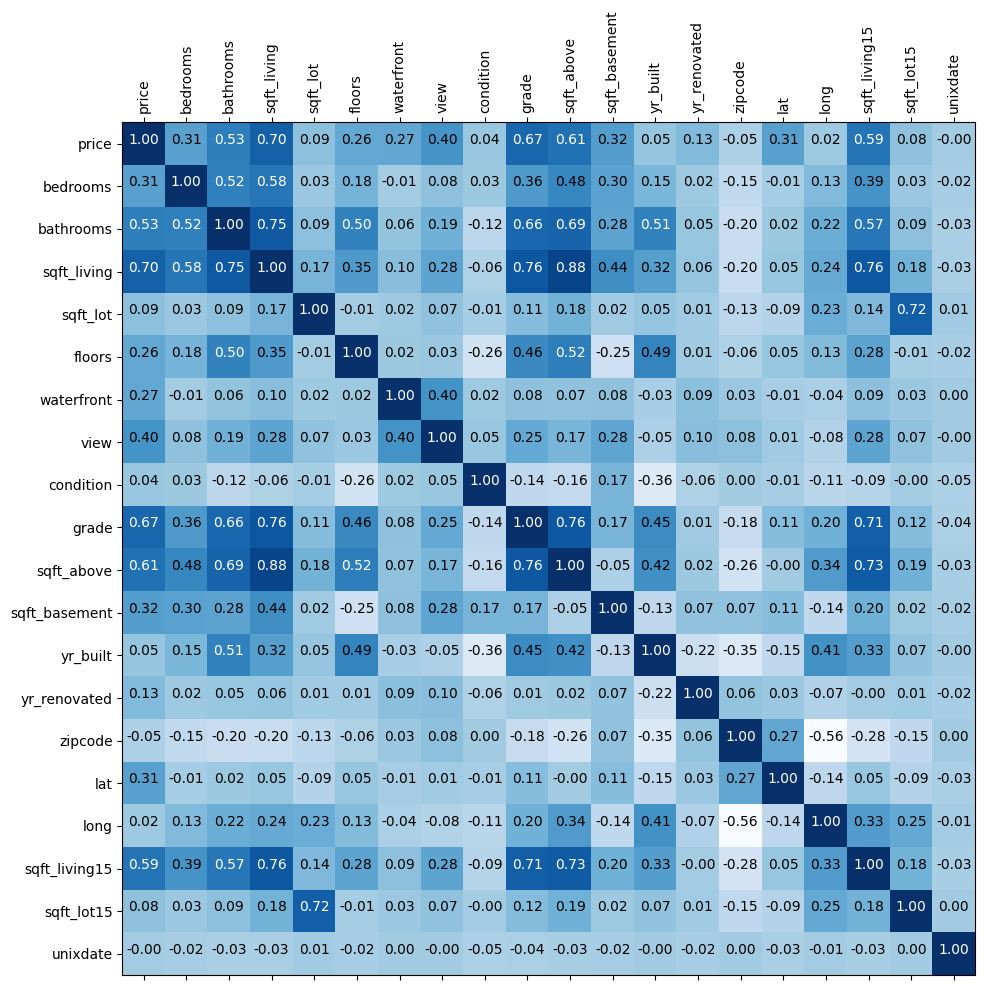

In [43]:
import itertools
import matplotlib.pyplot as plt
 
def plot_matrix(cm, labels,
                    normalize=False,
                    title='',
                    cmap=plt.cm.Blues):
    fig = plt.figure(figsize=(10,10))
    ax=fig.add_subplot(111)
    ax.matshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    # plt.colorbar()
    tick_marks = np.arange(len(labels))
    plt.xticks(tick_marks, labels, rotation=90)
    ax.set_xticks(tick_marks)
    ax.set_yticks(tick_marks)
    ax.set_xticklabels(labels)
    # ax.set_yticklabels(['']+labels)
    ax.set_yticklabels(labels)
 
    fmt = '.2f' #if normalize else 'd'
    thresh = 0.5
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
 
    plt.tight_layout()
    plt.show()
 
plot_matrix(rs,labels=df_3.columns)

In [45]:
df_4 = df_3.drop("unixdate", "sqft_living", "long", "zipcode", "yr_built", "condition")

In [46]:
model_4 = train_and_test(df_4)

Train Metrics:
{'r2': 0.6625398072363009, 'rmse': 214954.00313811935, 'mse': 46205223465.10262, 'mae': 134507.80218374712}
Test Metrics:
{'r2': 0.662939928732295, 'rmse': 206118.43751299012, 'mse': 42484810282.79641, 'mae': 135374.42881574866}


4.2 Transformacja logarytmiczna ceny

4.2.1 Wstępne i końcowe przetwarzanie danych

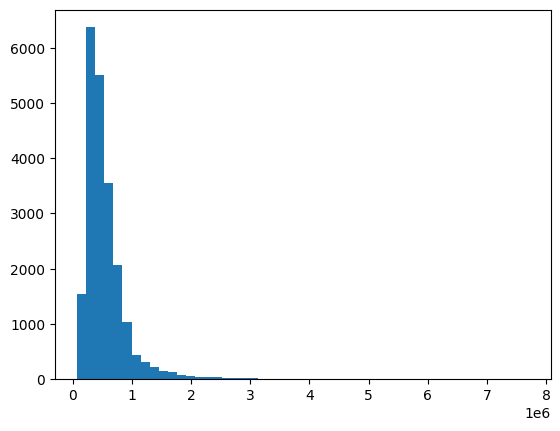

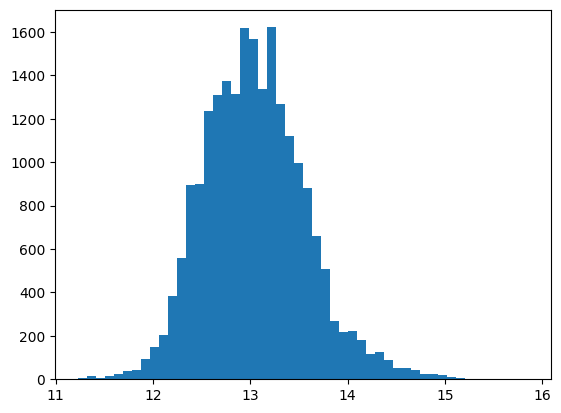

In [47]:
plt.hist(df_3.toPandas()['price'],bins=50)
plt.show()
 
plt.hist(np.log(df_3.toPandas()['price']),bins=50)
plt.show()

In [48]:
from pyspark.sql.functions import log
df_4 = df_3.withColumn("log_price", log(df_3["price"] + 1))

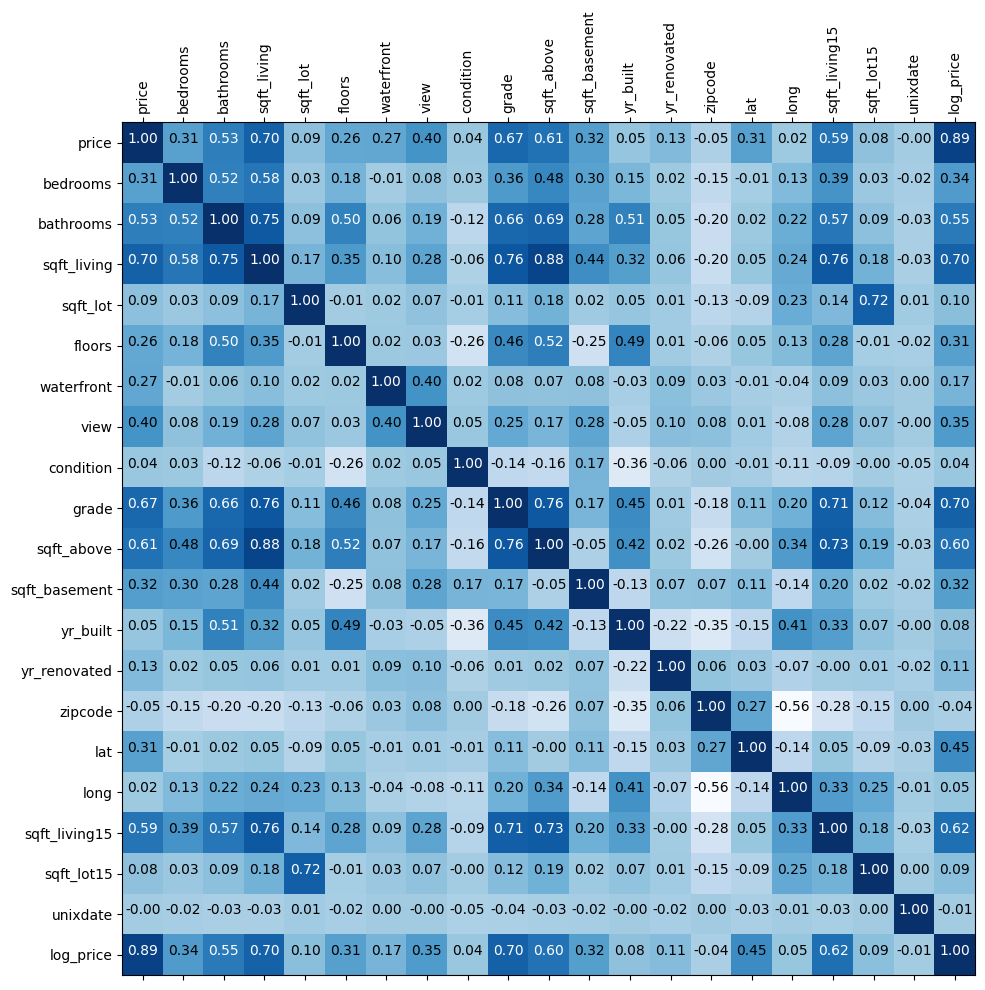

In [50]:
rs = correlation_table(df_4)
plot_matrix(rs, labels=df_4.columns)

Niektore argumenty sa lepiej skorelowane z log(price), niektore posiadaja mniejszy ptk korelacji, np: yr_renowated, view, waterfront ( ten ma najbardziej zmniejszony procent korelacji

In [71]:
def lr_train_and_test_log(df):

    #VA
    cols = df.columns
    cols.remove('price')
    cols.remove('log_price')
    va = VectorAssembler(inputCols=cols, outputCol="features")

    #LR
    lr = LinearRegression(featuresCol="features", labelCol="log_price").setMaxIter(100).setRegParam(0.1).setElasticNetParam(0.2)

    #PIPE
    pipeline = Pipeline(stages=[va,lr])

    df_train, df_test = df.randomSplit([0.8, 0.2], seed=42)

    model = pipeline.fit(df_train)

    predictions_train = model.transform(df_train)
    predictions_test = model.transform(df_test)

    predictions_train = predictions_train.withColumn("exp_pred", exp(predictions_train["prediction"]))
    predictions_test = predictions_test.withColumn("exp_pred", exp(predictions_test["prediction"]))

    evaluator = RegressionEvaluator(labelCol="price", predictionCol="exp_pred", metricName="rmse")
    rmse_train = evaluator.evaluate(predictions_train)
    rmse_test = evaluator.evaluate(predictions_test)

    evaluator = RegressionEvaluator(labelCol="price", predictionCol="exp_pred", metricName="r2")
    r2_train = evaluator.evaluate(predictions_train)
    r2_test = evaluator.evaluate(predictions_test)


    # Print metrics
    print("Training RMSE:", rmse_train)
    print("Test RMSE:", rmse_test)
    print("Training r2:", r2_train)
    print("Test r2:", r2_test)

    return model

In [78]:
log_mod = lr_train_and_test_log(df_4)

Training RMSE: 198338.94747814033
Test RMSE: 228121.01054340394
Training r2: 0.7126921556005468
Test r2: 0.5871386782525738


In [87]:
print_coeffs(df_4, log_mod, "price")

price=
+ bedrooms * -0.0014054221126532551
+ bathrooms * 0.004598698342316566
+ sqft_living * 8.439003558273622e-06
+ sqft_lot * 1.92160075104934e-08
+ floors * 0.005848054602335714
+ waterfront * 0.0016630696413030349
+ view * 0.0035263078973767873
+ condition * 0.003168486276517742
+ grade * 0.01269539676560678
+ sqft_above * 2.2813457809396104e-06
+ sqft_basement * 6.157742172060303e-06
+ yr_built * -0.00032539845712135
+ yr_renovated * 2.6387866370055584e-06
+ zipcode * 2.3663931526909127e-05
+ lat * 0.015386211973382012
+ long * -0.0009640129330412078
+ sqft_living15 * 9.747625998842856e-06
+ sqft_lot15 * -4.536141724981551e-08
+ unixdate * 1.4153842112164712e-10


4.2.2 Zastosowanie uogólnionego modelu liniowego (Generalized Linear Model)

In [82]:
def glr_train_and_test_log(df):

    #VA
    cols = df.columns
    cols.remove('price')
    cols.remove('log_price')
    va = VectorAssembler(inputCols=cols, outputCol="features")

    #LR
    from pyspark.ml.regression import GeneralizedLinearRegression
 
    glr = GeneralizedLinearRegression(family="gaussian", 
                                  link="log", 
                                  maxIter=100, 
                                  regParam=0.1,
                                  featuresCol="features",
                                  labelCol="log_price")
    #PIPE
    pipeline = Pipeline(stages=[va,glr])

    df_train, df_test = df.randomSplit([0.8, 0.2], seed=42)

    model = pipeline.fit(df_train)

    predictions_train = model.transform(df_train)
    predictions_test = model.transform(df_test)

    predictions_train = predictions_train.withColumn("exp_pred", exp(predictions_train["prediction"]))
    predictions_test = predictions_test.withColumn("exp_pred", exp(predictions_test["prediction"]))

    evaluator = RegressionEvaluator(labelCol="price", predictionCol="exp_pred", metricName="rmse")
    rmse_train = evaluator.evaluate(predictions_train)
    rmse_test = evaluator.evaluate(predictions_test)

    evaluator = RegressionEvaluator(labelCol="price", predictionCol="exp_pred", metricName="r2")
    r2_train = evaluator.evaluate(predictions_train)
    r2_test = evaluator.evaluate(predictions_test)


    # Print metrics
    print("Training RMSE:", rmse_train)
    print("Test RMSE:", rmse_test)
    print("Training r2:", r2_train)
    print("Test r2:", r2_test)

    return model

In [88]:
log_mod = glr_train_and_test_log(df_4)
print_coeffs(df_4, log_mod, "price")

Training RMSE: 259834.7522071775
Test RMSE: 332606.87836062897
Training r2: 0.5069102804804633
Test r2: 0.12232025162315807
price=
+ bedrooms * -0.0014054221126532551
+ bathrooms * 0.004598698342316566
+ sqft_living * 8.439003558273622e-06
+ sqft_lot * 1.92160075104934e-08
+ floors * 0.005848054602335714
+ waterfront * 0.0016630696413030349
+ view * 0.0035263078973767873
+ condition * 0.003168486276517742
+ grade * 0.01269539676560678
+ sqft_above * 2.2813457809396104e-06
+ sqft_basement * 6.157742172060303e-06
+ yr_built * -0.00032539845712135
+ yr_renovated * 2.6387866370055584e-06
+ zipcode * 2.3663931526909127e-05
+ lat * 0.015386211973382012
+ long * -0.0009640129330412078
+ sqft_living15 * 9.747625998842856e-06
+ sqft_lot15 * -4.536141724981551e-08
+ unixdate * 1.4153842112164712e-10


4.3 Variance Inflation Factor

In [89]:
def compute_vif(df,label_col):
    """
    Funkcja przeprowadza regresję na całym zbiorze danych, traktując label_col, jako zmienną objasnianą. 
    Czyli konfigurując ''Vector Assembler'' pomija tę kolumnę. buduje model regresji i odczytuje 
    wartośc współczynnika determinacji ''r2'' z model.summary. Następnie zwraca 1/(1-r2)
    Uwaga, jeżeli r2==1, nelezy odjąć od r2 niewielką wartośc, np. 1e-10
 
    :param df: wejściowy zbiór danych
    :param label_col: nazwa atrybut, dla którego należy obliczyć VIF 
    :return: wartość parazmetru VIF 
    """

    cols = [col for col in df.columns if col != label_col]
    
    va = VectorAssembler(inputCols=cols, outputCol="features")
    dfa = va.transform(df)

    lr = LinearRegression(featuresCol="features", labelCol=label_col)\
        .setMaxIter(100)\
        .setRegParam(0.1)\
        .setElasticNetParam(0.2)

    model = lr.fit(dfa)

    r2 = model.summary.r2
    
    if r2 == 1:
        r2 -= 1e-10
    vif = 1 / (1 - r2)
    
    return vif

In [90]:
df_5 = df_3.drop('price')
vifs = []
for f in df_5.columns:
    vifs.append((f,compute_vif(df_5,f)))
 
print(vifs)

[('bedrooms', 1.6057571383337566), ('bathrooms', 3.246484130248674), ('sqft_living', 21827055.80967465), ('sqft_lot', 2.102605006981757), ('floors', 1.8823174345662346), ('waterfront', 1.0677030347221141), ('view', 1.4030506275741752), ('condition', 1.2187618138367542), ('grade', 3.3379945116345255), ('sqft_above', 10117557.457632868), ('sqft_basement', 261897.23869519646), ('yr_built', 2.430440473020881), ('yr_renovated', 1.1514535266471402), ('zipcode', 1.6621936345046073), ('lat', 1.0368033207397422), ('long', 1.447380808054897), ('sqft_living15', 2.9799163181252397), ('sqft_lot15', 2.1356682313833), ('unixdate', 1.0073683948324426)]


In [91]:
def remove_collinear_features(df, label_col, threshold=5.0, omit=(True, "sqft_living")):

    features_to_keep = []
    cols = [col for col in df.columns if col != label_col]
    for col in cols:
        vif = compute_vif(df, col);
        if omit[0] and col == omit[1]:
           features_to_keep.append(col) 
        else:
            if vif < threshold:               
                features_to_keep.append(col)


    return df.select(features_to_keep + [label_col])



In [92]:
df_6 = remove_collinear_features(df_3, "price", 5.0, (False,))
df_6.show()

model = train_and_test(df_6)
print(model)

print_coeffs(df_6, model, "price")

+--------+---------+--------+------+----------+----+---------+-----+--------+------------+-------+-------+--------+-------------+----------+----------+---------+
|bedrooms|bathrooms|sqft_lot|floors|waterfront|view|condition|grade|yr_built|yr_renovated|zipcode|    lat|    long|sqft_living15|sqft_lot15|  unixdate|    price|
+--------+---------+--------+------+----------+----+---------+-----+--------+------------+-------+-------+--------+-------------+----------+----------+---------+
|       3|      1.0|    5650|   1.0|         0|   0|        3|    7|    1955|           0|  98178|47.5112|-122.257|         1340|      5650|1413158400| 221900.0|
|       3|     2.25|    7242|   2.0|         0|   0|        3|    7|    1951|        1991|  98125| 47.721|-122.319|         1690|      7639|1418083200| 538000.0|
|       2|      1.0|   10000|   1.0|         0|   0|        3|    6|    1933|           0|  98028|47.7379|-122.233|         2720|      8062|1424822400| 180000.0|
|       4|      3.0|    5000

Train Metrics:
{'r2': 0.6668226143777345, 'rmse': 211996.54667733566, 'mse': 44942535803.11575, 'mae': 130498.99216822114}
Test Metrics:
{'r2': 0.6524988956985291, 'rmse': 216030.3582838472, 'mse': 46669115700.24739, 'mae': 130512.22974003939}
PipelineModel_b94129dc3cb6
price=
+ bedrooms * -2325.941592143232
+ bathrooms * 104265.29823134161
+ sqft_lot * 0.3269364764462952
+ floors * 12213.33341637122
+ waterfront * 653655.0385464814
+ view * 56249.1299932751
+ condition * 28077.20447675968
+ grade * 136853.33230130872
+ yr_built * -3157.3540954821074
+ yr_renovated * 20.344764936964634
+ zipcode * -513.0656868106153
+ lat * 575827.380797673
+ long * -167424.45775691036
+ sqft_living15 * 95.71497789133099
+ sqft_lot15 * -0.26895810049501273
+ unixdate * 0.0013825983047925585


In [93]:
df_6 = remove_collinear_features(df_3, "price", 5.0, (True, "sqft_living"))
df_6.show()

model = train_and_test(df_6)
print(model)
print_coeffs(df_6, model, "price")

+--------+---------+-----------+--------+------+----------+----+---------+-----+--------+------------+-------+-------+--------+-------------+----------+----------+---------+
|bedrooms|bathrooms|sqft_living|sqft_lot|floors|waterfront|view|condition|grade|yr_built|yr_renovated|zipcode|    lat|    long|sqft_living15|sqft_lot15|  unixdate|    price|
+--------+---------+-----------+--------+------+----------+----+---------+-----+--------+------------+-------+-------+--------+-------------+----------+----------+---------+
|       3|      1.0|       1180|    5650|   1.0|         0|   0|        3|    7|    1955|           0|  98178|47.5112|-122.257|         1340|      5650|1413158400| 221900.0|
|       3|     2.25|       2570|    7242|   2.0|         0|   0|        3|    7|    1951|        1991|  98125| 47.721|-122.319|         1690|      7639|1418083200| 538000.0|
|       2|      1.0|        770|   10000|   1.0|         0|   0|        3|    6|    1933|           0|  98028|47.7379|-122.233|   

4.4 Normalizacja cech

In [94]:
from pyspark.ml.feature import StandardScaler

In [199]:
def train_and_test_scaled(df,lr=LinearRegression()
                          .setMaxIter(100)
                          .setRegParam(3.0)
                          .setElasticNetParam(0.5)
                          ,apply_normalization = False, label="price"):


    cols = [col for col in df.columns if col != label]

    stages = [];

    va = VectorAssembler(inputCols=cols, outputCol="features")
    stages.append(va)

    features_col=""

    if apply_normalization:
        ss = StandardScaler(inputCol="features", outputCol="features_scaled")
        stages.append(ss)
        features_col = "features_scaled"
    else:
        features_col = "features"

    print(features_col)
    lr = lr.setLabelCol(label).setFeaturesCol(features_col)

    stages.append(lr)

    pipeline = Pipeline(stages=stages)
    
    model = pipeline.fit(df)

    df_train, df_test = df.randomSplit([0.7, 0.3], seed=42)
    
    train_predictions = model.transform(df_train)
    test_predictions = model.transform(df_test)
    
    train_metrics = evaluate_metrics(train_predictions, label_col=label)
    test_metrics = evaluate_metrics(test_predictions, label_col=label)
    
    print("Train Metrics:")
    print(train_metrics)
    print("Test Metrics:")
    print(test_metrics)
    
    return train_predictions, test_predictions, model

In [193]:
train, test, model = train_and_test_scaled(df_3)
print(model)
print_coeffs(df_3, model, "price")

features
Train Metrics:
{'r2': 0.7006426573082141, 'rmse': 204004.5108355468, 'mse': 41617840441.250725, 'mae': 126247.34899924089}
Test Metrics:
{'r2': 0.702031628370053, 'rmse': 192750.82391718234, 'mse': 37152880120.75263, 'mae': 124310.10775162526}
PipelineModel_81cd6bd9380d
price=
+ bedrooms * -35874.261622363185
+ bathrooms * 41367.98406965218
+ sqft_living * 93.35513672914755
+ sqft_lot * 0.12557764875169908
+ floors * 7153.239511194613
+ waterfront * 582543.5213919264
+ view * 52600.13908516294
+ condition * 27733.841940003687
+ grade * 96235.1232579943
+ sqft_above * 87.70387507753587
+ sqft_basement * 56.860010336644926
+ yr_built * -2618.315287945369
+ yr_renovated * 20.791219706355605
+ zipcode * -580.6407970475022
+ lat * 605265.633891153
+ long * -213616.06794720277
+ sqft_living15 * 21.95480036255449
+ sqft_lot15 * -0.3823348201702422
+ unixdate * 0.0013485473144873418


Czy skalowanie ma wpływ na działanie algorytmu? W przypadku OLS nie. W przypadku regularyzacji tak. Zastanów się dlaczego?

W przypadku technik regularyzacji, takich jak Lasso, Ridge i Elastic Net, skalowanie danych może mieć istotny wpływ na wyniki.

Techniki te dodają do funkcji celu kary za wielkość współczynników co pomaga w redukcji przeuczenia modelu. Skalowanie danych może wpłynąć na karę regularyzacji, ponieważ różne skale danych mogą prowadzić do różnych wartości współczynników.

5. Cechy wielomianowe
6. 
5.1 Czy lokalizacja domów ma wpływ na cenę?

In [ ]:
!pip install geopandas folium mapclassify

In [143]:
df_3.agg({'price':'min'}).collect()[0][0]
df_3.agg({'price':'max'}).collect()[0][0]
pdf= df_3.toPandas()
import geopandas as gpd
gdf = gpd.GeoDataFrame(pdf, geometry=gpd.GeoSeries.from_xy(pdf['long'], pdf['lat']), crs=4326)

In [99]:
gdf[gdf.price<=gdf.price.quantile(.95)].explore('price')

In [144]:
df_8 = df_3.withColumn("lat_2", col("lat") * col("lat"))\
           .withColumn('long_2', col('long') * col('long'))\
           .withColumn('lat_long', col('lat') * col('long'))

In [206]:
train, test, model = train_and_test_scaled(df_8, apply_normalization=True, label="lat_long")

column_names = [col for col in df_8.columns if col != "lat_long"]

print("lat_long=")
    
i = 0;
    
for coef in model.stages[2].coefficients:
    print("+ " + column_names[i] + " * " + str(coef))
    i+=1

features_scaled


Train Metrics:
{'r2': 0.9822640170412814, 'rmse': 2.5341134956609306, 'mse': 6.421731208890862, 'mae': 2.1121901184964194}
Test Metrics:
{'r2': 0.9821167168017674, 'rmse': 2.547562251586849, 'mse': 6.490073425710254, 'mae': 2.1313287980054274}
lat_long=
+ price * 0.0
+ bedrooms * 0.0
+ bathrooms * 0.0
+ sqft_living * 0.0
+ sqft_lot * 0.0
+ floors * 0.0
+ waterfront * 0.0
+ view * 0.0
+ condition * 0.0
+ grade * 0.0
+ sqft_above * 0.0
+ sqft_basement * 0.0
+ yr_built * 0.0
+ yr_renovated * 0.0
+ zipcode * 0.0
+ lat * -7.518385491962724
+ long * 2.622929649340144
+ sqft_living15 * 0.0
+ sqft_lot15 * 0.0
+ unixdate * 0.0
+ lat_2 * -7.519413964339033
+ long_2 * -2.6237853096219217


5.2 Cechy wielomianowe dla wszystkich atrybutów

In [216]:
from pyspark.ml.feature import MinMaxScaler, PolynomialExpansion
 
def train_and_test_scaled_polynomial_features(df,lr=LinearRegression()
                          .setMaxIter(100)
                          .setRegParam(3.0)
                          .setElasticNetParam(0.5)
                          .setFeaturesCol("features_poly")
                          .setLabelCol("price")):
    """
    (1) Buduje ciąg przetwarzania obejmujący VectorAssembler, MinMaxScaler, PolynomialExpansioni lr
    (2) Dzieli zbiór na treningowy i testowy
    (3) Przeprowadza regresje i drukuje metryki dla zbioru treningowego i testowego
    param: df - zbiór danych
    param: lr - algorytm regresji
    returns: model pipeline
    """

    cols = [col for col in df.columns if col != "price"]

    va = VectorAssembler(inputCols=cols, outputCol="features")

    mms = MinMaxScaler(inputCol="features", outputCol="scaled_features")

    pe = PolynomialExpansion(inputCol="scaled_features", outputCol="features_poly")
    
    stages = [va, mms, pe, lr]
    pipeline = Pipeline(stages=stages)

    train_data, test_data = df.randomSplit([0.7, 0.3], seed=42)

    model = pipeline.fit(train_data)

    train_predictions = model.transform(train_data)
    test_predictions = model.transform(test_data)

    train_metrics = evaluate_metrics(train_predictions)
    test_metrics = evaluate_metrics(test_predictions)
    
    print("Train Metrics:")
    print(train_metrics)
    print("Test Metrics:")
    print(test_metrics)

    return model
    

In [217]:
model = train_and_test_scaled_polynomial_features(df_3)

Train Metrics:
{'r2': 0.8240623775386801, 'rmse': 156395.47098615582, 'mse': 24459543344.981506, 'mae': 102611.1783473429}
Test Metrics:
{'r2': 0.7911049489624589, 'rmse': 161389.48469439696, 'mse': 26046565769.92299, 'mae': 101821.12078215615}


In [227]:
from pyspark.ml.regression import DecisionTreeRegressor
from pyspark.ml.regression import RandomForestRegressor
from pyspark.ml.regression import GBTRegressor
 
for r in [DecisionTreeRegressor(),RandomForestRegressor(),GBTRegressor()]:
    print(f'=== {r.__class__.__name__} ===')
    model = train_and_test_scaled_polynomial_features(df_3, r.setFeaturesCol("features_poly").setLabelCol("price"))

=== DecisionTreeRegressor ===


Train Metrics:
{'r2': 0.779060530359637, 'rmse': 175259.45888020966, 'mse': 30715877926.9839, 'mae': 105889.84901895348}
Test Metrics:
{'r2': 0.7345790423636495, 'rmse': 181919.2953836943, 'mse': 33094630032.89981, 'mae': 108851.63955754292}
=== RandomForestRegressor ===


Train Metrics:
{'r2': 0.8318999786311677, 'rmse': 152872.26392441627, 'mse': 23369929077.37639, 'mae': 91495.71698893877}
Test Metrics:
{'r2': 0.8197963790950329, 'rmse': 149896.99132053426, 'mse': 22469108006.948322, 'mae': 91283.46231235706}
=== GBTRegressor ===


Train Metrics:
{'r2': 0.8995752083525789, 'rmse': 118158.58529713664, 'mse': 13961451279.420715, 'mae': 80176.52853138513}
Test Metrics:
{'r2': 0.7343860634638031, 'rmse': 181985.4171528693, 'mse': 33118692056.303856, 'mae': 92768.62747828357}
